# Image Filtering

The main objectives of this module are:

* Implement point filtering with look-up tables.
* Implement region filtering with kernel convolution, morphological operations and edge detection.
* Understand spatial frequency information with the Fourier transform.

## 1. Look-up tables

Look-up tables are a very useful tool to perform simple pixel-level filtering of an image.

Numpy arrays indexing ([see reference here](http://docs.scipy.org/doc/numpy/user/basics.indexing.html)) is a very powerful tool, but can be a bit counter-intuitive at first. We will use it to quickly create and use look-up tables to transform an image.

Look at the short example below. 

We construct an image with 4 possible values for each pixel (-> $I(x,y) \in \{0,1,2,3\}$). We then build the following LUT:

|Input value|Output value|
|--|--|
|0|2|
|1|3|
|2|1|
|3|0|

And we apply it on the image.

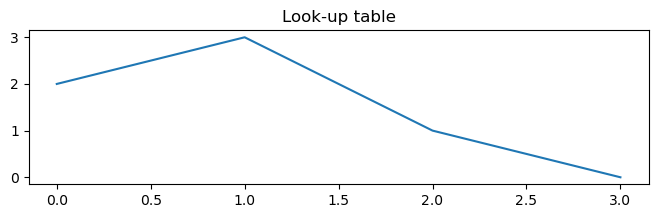

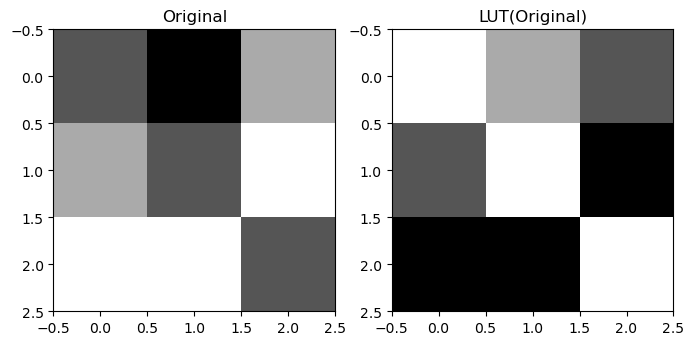

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline

# Let's create a 3x3 "image" with 4 possible pixel values (in [0,3])
im = np.array([[1,0,2],[2,1,3],[3,3,1]])

# look-up table is a vector of size 4 mapping the new value for the pixels of m
lut = np.array([2,3,1,0]) # maps 0 -> 2, 1 -> 3, 2 -> 1, 3 -> 0

plt.figure(figsize=(8,2))
plt.plot(lut)
plt.title('Look-up table')
plt.show()

# we can use numpy vector indexing to apply the look-up table:
new_im = lut[im] # This will create a new array with the same size as m

plt.figure(figsize=(8,4))
plt.subplot(1,2,1) #supblot is useful to display images side-by-side
plt.imshow(im, cmap=cm.gray)
plt.title('Original')
plt.subplot(1,2,2)
plt.imshow(new_im, cmap=cm.gray)
plt.title('LUT(Original)')
plt.show()

**Starting from this example, create the following LUTs** and apply them to the "walking.jpg" image:
1. For inverting an image (so that $0 \rightarrow 255$, $255 \rightarrow 0$)
1. To keep only graylevel such that $g \ge t$, setting all other values to 0.
1. To reduce the number of gray levels from 256 to 8 (so that $255 \rightarrow 7$, $0 \rightarrow 0$).
1. To "stretch" the histogram so that, given a **minimum value** $T_{min}$ and a **maximum value** $T_{max}$, we have :
    * If $I(x,y) < T_{min}$, the new value is set to 0
    * If $I(x,y) > T_{max}$, the new value is set to 255
    * Values between $T_{min}$ and $T_{max}$ are stretched to cover the entire histogram.
1. to perform an **equalization** of the cameraman image (so that the histogram becomes "as flat as possible")

<Figure size 640x480 with 0 Axes>

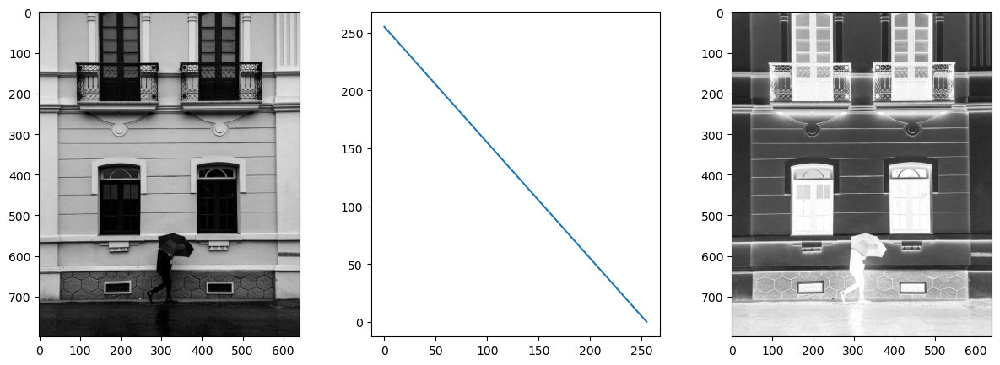

In [25]:
from skimage.io import imread,imshow,imsave

im = imread('walking.jpg')

# 1
lut_1 = np.arange(255,-1,-1)

def display_lut(lut, im):
    new_im = lut[im]
    plt.gray()
    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(im)
    plt.subplot(1,3,2)
    plt.plot(lut)
    plt.subplot(1,3,3)
    plt.imshow(new_im)
    plt.show()

display_lut(lut_1, im)


<Figure size 640x480 with 0 Axes>

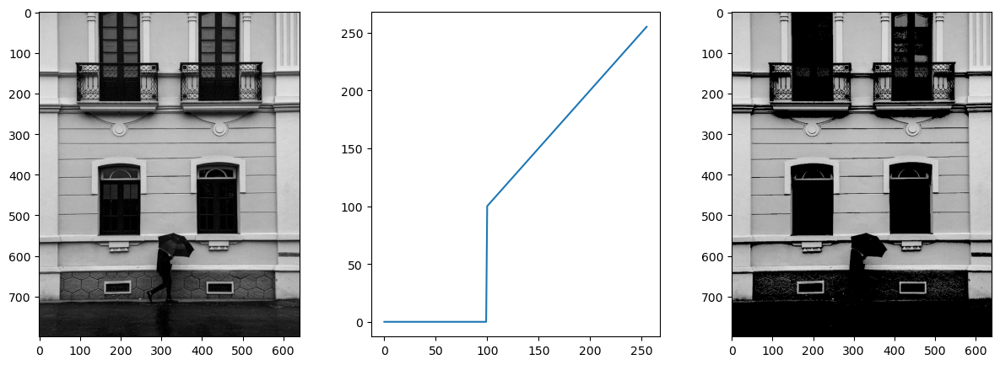

In [26]:
# 2
t = 100
lut_2 = np.arange(256)
for i in lut_2:
    if i < t:
        lut_2[i] = 0

display_lut(lut_2, im)

<Figure size 640x480 with 0 Axes>

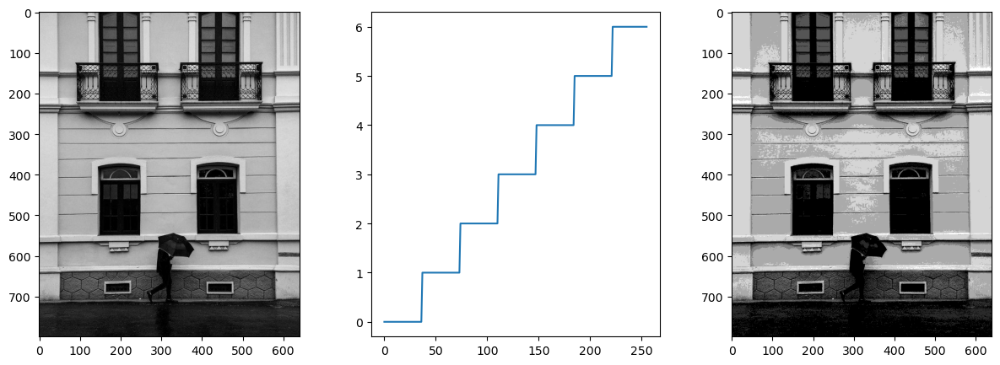

In [27]:
# 3
lut_3 = np.arange(256)//37

display_lut(lut_3, im)

<Figure size 640x480 with 0 Axes>

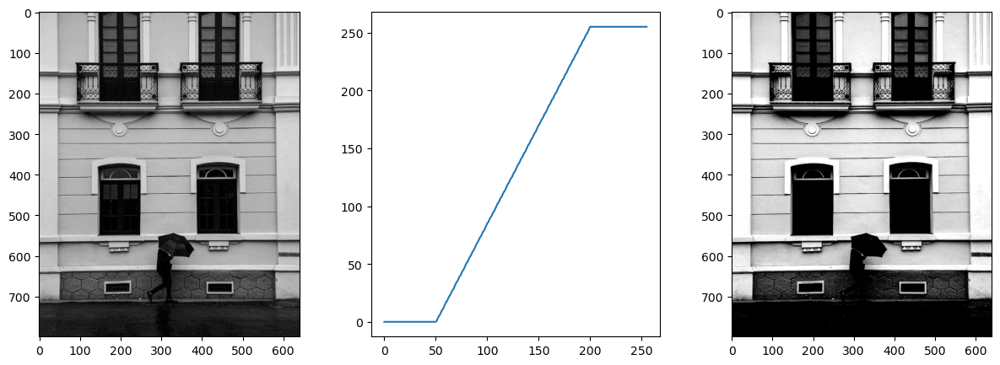

In [28]:
# 4
Tmin = 50
Tmax = 200
lut_4 = np.arange(256)
lut_4[:Tmin] = 0
lut_4[Tmax:] = 255
lut_4[Tmin:Tmax] = (255/(Tmax - Tmin)) * (lut_4[Tmin:Tmax] - Tmin)

display_lut(lut_4, im)

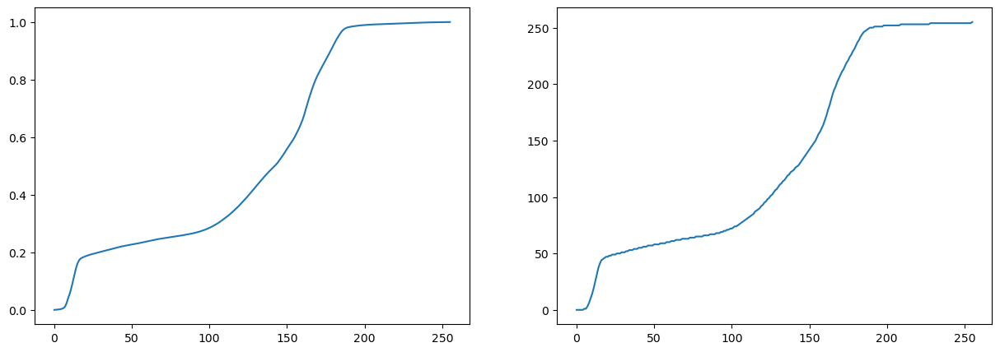

<Figure size 640x480 with 0 Axes>

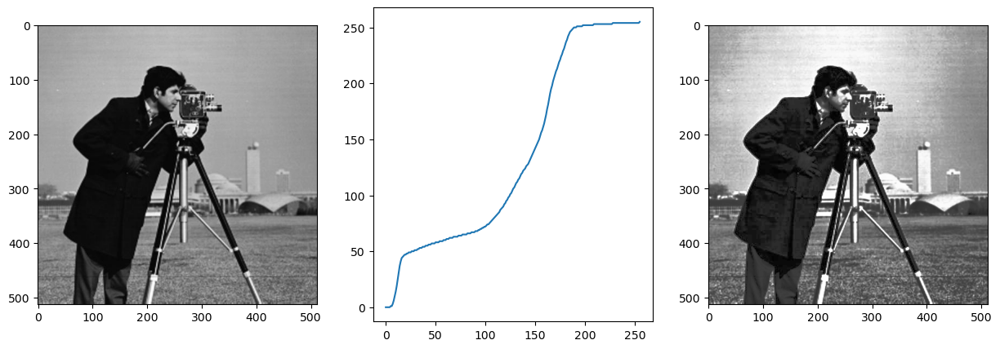

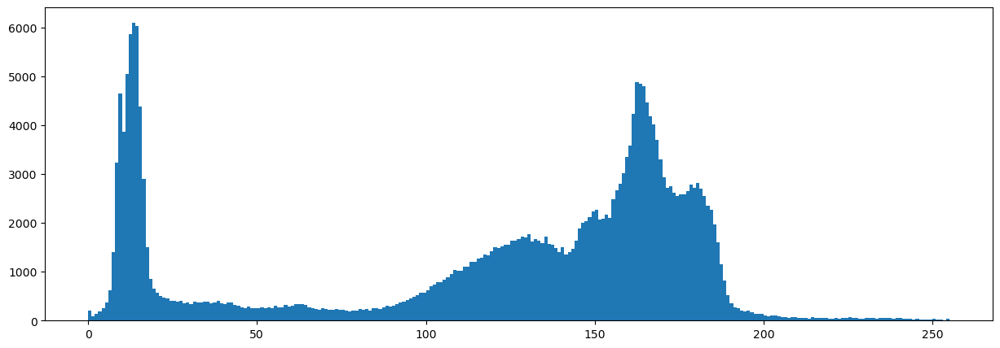

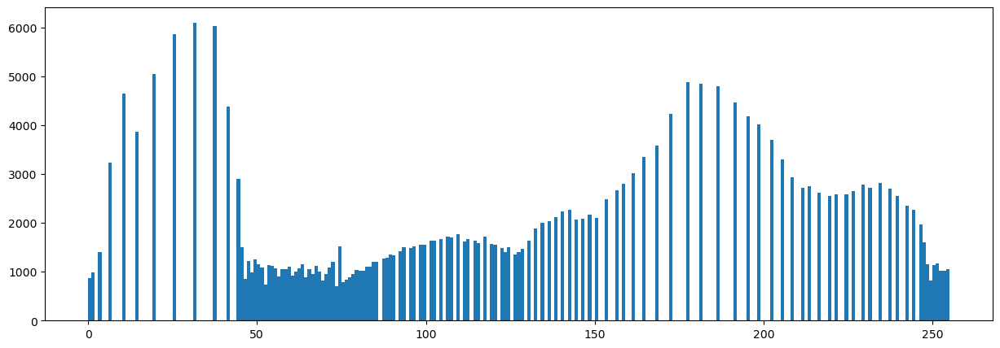

In [29]:
# 5

im_cam = imread('camera.jpg')

def cumul_hist(im):
    hist = np.zeros(256)
    c = 0
    for i in range(256):
        c += (im == i).sum()
        hist[i] = c
    hist /= hist.max()    
    return hist

h = cumul_hist(im_cam)
lut_5 = (h*255).astype(np.uint8)


plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(h)
plt.subplot(1,2,2)
plt.plot(lut_5)
plt.show()

display_lut(lut_5, im_cam)

plt.figure(figsize=(15,5))
plt.hist(im_cam.flatten(), bins=np.arange(256))
plt.show()
plt.figure(figsize=(15,5))
plt.hist(lut_5[im_cam].flatten(), bins=np.arange(256))
plt.show()

**Need more help? You can check the following videos:**

* [Look-Up Tables](https://www.youtube.com/watch?v=PHiiKoSsVac&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=13)
* [Auto-levels](https://www.youtube.com/watch?v=DLN4jfBJakQ&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=14)
* [Equalization](https://www.youtube.com/watch?v=C44WuMUudik&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=15)

## 2. Kernel convolution

Kernal convolution allows us to filter an image based on the values of a neighborhood.

Write a program that applies a 3x3 kernel convolution on an image. Use it on the "walking" image to perform a mean filter.

In [30]:
im = imread('walking.jpg')

# The "image" will be a 5x5 array
a = np.arange(25).reshape((5,5))
new_a = a.copy()
print("a")
print(a)

# We take a 3x3 kernel
k = np.arange(9).reshape((3,3))-4
print("k")
print(k)

# What will the new value of the pixel "6" be in the new image ?
# We have to center the kernel on that pixel, and multiply all the corresponding values:
conv_6 = a[0:3,0:3]*k
print("multiplying neighbourhood of '6' by kernel")
print(conv_6)

# Then we sum those values
new6 = conv_6.sum()
new_a[1,1] = new6

print("image with new value for '6'")
print(new_a)


a
[[ 0  1  2  3  4]
 [ 5  6  7  8  9]
 [10 11 12 13 14]
 [15 16 17 18 19]
 [20 21 22 23 24]]
k
[[-4 -3 -2]
 [-1  0  1]
 [ 2  3  4]]
multiplying neighbourhood of '6' by kernel
[[ 0 -3 -4]
 [-5  0  7]
 [20 33 48]]
image with new value for '6'
[[ 0  1  2  3  4]
 [ 5 96  7  8  9]
 [10 11 12 13 14]
 [15 16 17 18 19]
 [20 21 22 23 24]]


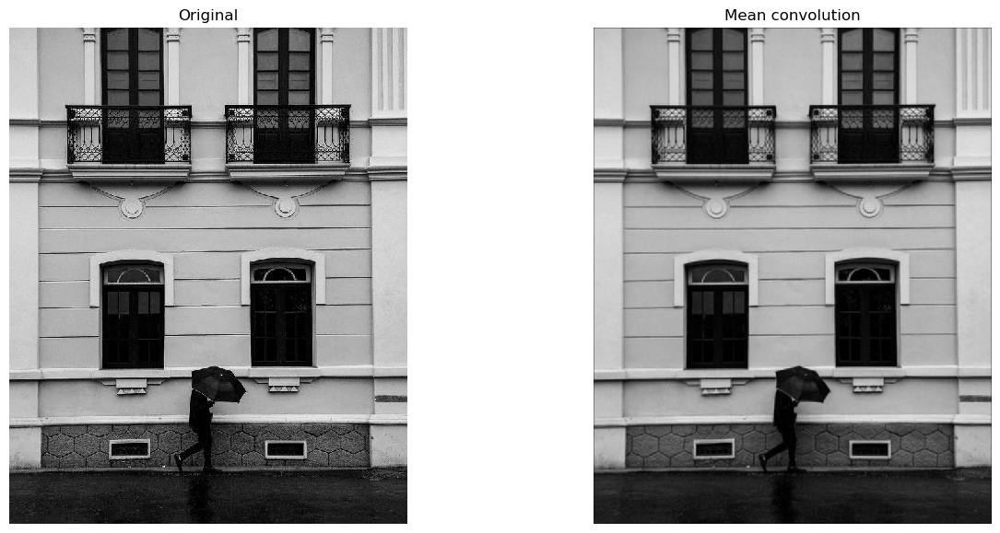

In [31]:
def conv(im, kernel):
    # zero-padding
    new_im = np.zeros((im.shape[0]+2, im.shape[1]+2))
    new_im[1:-1,1:-1] = im

    im_out = np.zeros(im.shape)

    for i in range(im.shape[0]):
        for j in range(im.shape[1]):
            im_out[i,j] = (new_im[i:i+3,j:j+3]*kernel).sum()

    return im_out

mean_k = np.ones((3,3))/9.
im_mean = conv(im,mean_k)

plt.figure(figsize=(15,7))
plt.subplot(1,2,1)
plt.imshow(im, cmap=plt.cm.gray, vmin=0, vmax=255, interpolation='none')
plt.title('Original')
plt.axis('off')
plt.subplot(1,2,2)
plt.imshow(im_mean, cmap=plt.cm.gray, vmin=0, vmax=255, interpolation='none')
plt.title('Mean convolution')
plt.axis('off')
plt.show()

Using the [median filter](https://scikit-image.org/docs/stable/api/skimage.filters.rank.html#skimage.filters.rank.median) and the [mean filter](https://scikit-image.org/docs/dev/api/skimage.filters.rank.html#skimage.filters.rank.mean) from scikit-image, compare the behaviour of the two filters with neighborhood of increasing sizes on the "noisy" astronaut image:

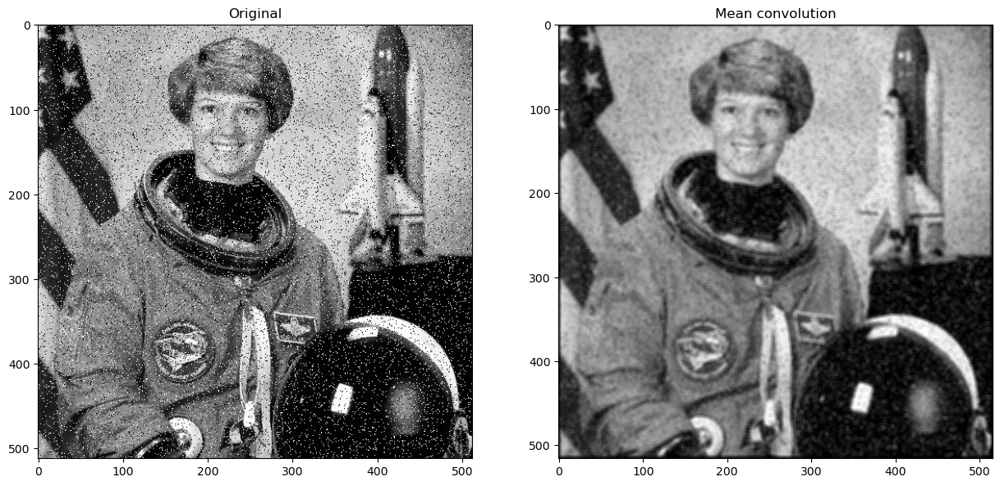

In [32]:
from skimage.filters.rank import mean, median
from scipy.signal import convolve2d
from skimage.morphology import disk

im = imread('astronaut_noisy.jpg')
# im = im[::5,::5]  # subsampling
# imshow(im)

# Mean kernel
ksize = 5
mean_k = np.ones((ksize,ksize))
mean_k /= mean_k.sum()

im_out = convolve2d(im, mean_k)

plt.figure(figsize=(15,7))
plt.gray()
plt.subplot(1,2,1)
plt.imshow(im)
plt.title('Original')
plt.subplot(1,2,2)
plt.imshow(im_out)
plt.title('Mean convolution')
plt.show()



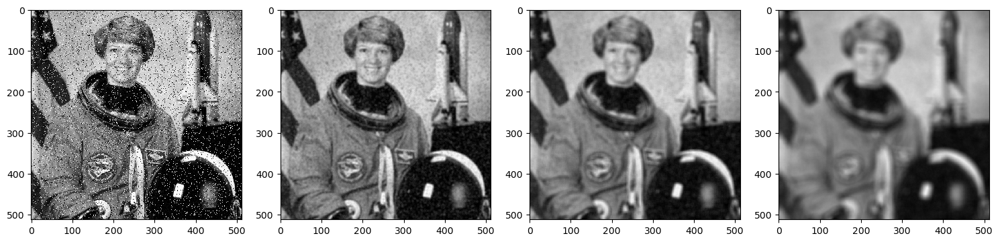

In [33]:
# let's use the mean function directly

plt.figure(figsize=(15,5))
plt.subplot(1,4,1)
imshow(im)
plt.subplot(1,4,2)
imshow(mean(im,disk(3)))
plt.subplot(1,4,3)
imshow(mean(im,disk(5)))
plt.subplot(1,4,4)
imshow(mean(im,disk(10)))
plt.show()


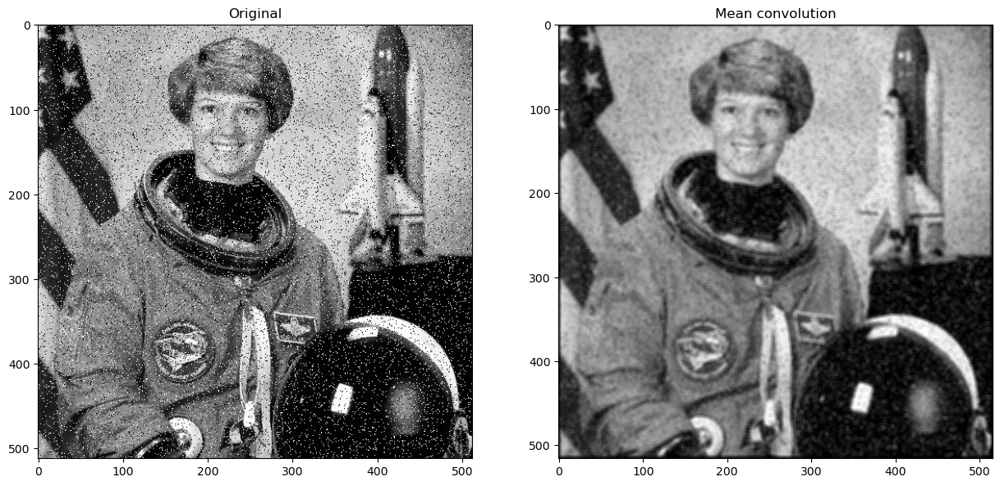

In [34]:
# Median kernel
ksize = 5
im_out2 = np.zeros(im.shape)
for y in range(ksize//2, im.shape[0]-ksize//2): # we skip the borders
    for x in range(ksize//2, im.shape[1]-ksize//2):
        im_out2[y,x] = np.median(im[y-ksize//2:y+ksize//2+1, x-ksize//2:x+ksize//2+1])

plt.figure(figsize=(15,7))
plt.gray()
plt.subplot(1,2,1)
plt.imshow(im)
plt.title('Original')
plt.subplot(1,2,2)
plt.imshow(im_out)
plt.title('Mean convolution')
plt.show()

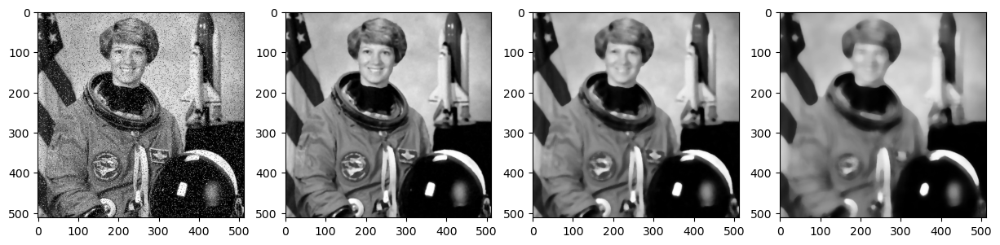

In [35]:
# Let's use the median function directly

plt.figure(figsize=(15,5))
plt.subplot(1,4,1)
plt.imshow(im)
plt.subplot(1,4,2)
plt.imshow(median(im,disk(3)))
plt.subplot(1,4,3)
plt.imshow(median(im,disk(5)))
plt.subplot(1,4,4)
plt.imshow(median(im,disk(10)))
plt.show()

**Need more help? You can check the following videos:**

* [Kernel convolution](https://www.youtube.com/watch?v=FaTvGWPnLng&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=16)
* [Mean and Median filters](https://www.youtube.com/watch?v=GLTuF3lwDLs&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=17)

## 3. 2D Fourier transform

The 2D Fourier transform allows us to get a representation of the spatial frequencies present in an image. A very powerful way of filtering images is to modify those frequencies directly by modifying the "Fourier image", and to use the inverse transform to get the pixel values of the filtered image.

Let's illustrate that with a fake example. We start with a completely random signal and compute the Fourier transform. Note that the Fourier image is complex, so we use its amplitude. As the range of amplitudes is so high that we don't see much in the resulting image, we display the log of the amplitude.

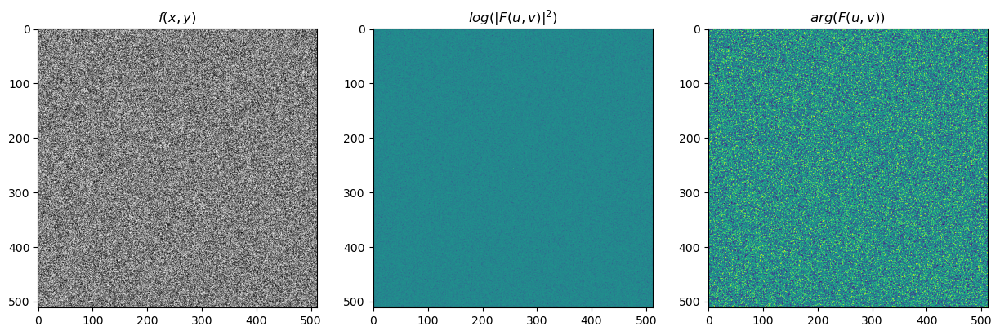

In [36]:
from numpy.fft import fft2,ifft2,fftshift,ifftshift
# fft2 -> Fourier transform
# ifft2 -> Inverse transform
# fftshift & ifftshift -> reorganize the "Fourier image" to make it more easily interpretable.

def fourier2(im):
    return fftshift(fft2(im))

def inv_fourier2(im):
    return ifft2(ifftshift(im)).real

def ampl(f):
    return np.sqrt(f.real**2+f.imag**2)

def phase(f):
    return np.arctan2(f.imag,f.real)

def show_fourier(im,f):
    plt.figure(figsize=[15,5])
    plt.subplot(1,3,1)
    plt.imshow(im,cmap = plt.cm.gray)
    plt.title('$f(x,y)$')
    plt.subplot(1,3,2)
    plt.imshow(np.log(ampl(f)), cmap = 'viridis')# show log so as to see more than just the global maximum
    plt.title('$log(|F(u,v)|^2)$')
    plt.subplot(1,3,3)
    plt.imshow(phase(f),cmap = 'viridis')
    plt.title('$arg(F(u,v))$')
    plt.show()

im = np.random.random((512,512))
f = fourier2(im)
amplitude = ampl(f)

show_fourier(im,f)

We could now, for instance, decide to add an horizontal frequency by creating peaks in the Fourier image on the horizontal axis. The further away from the center we put the peaks, the higher the frequency.

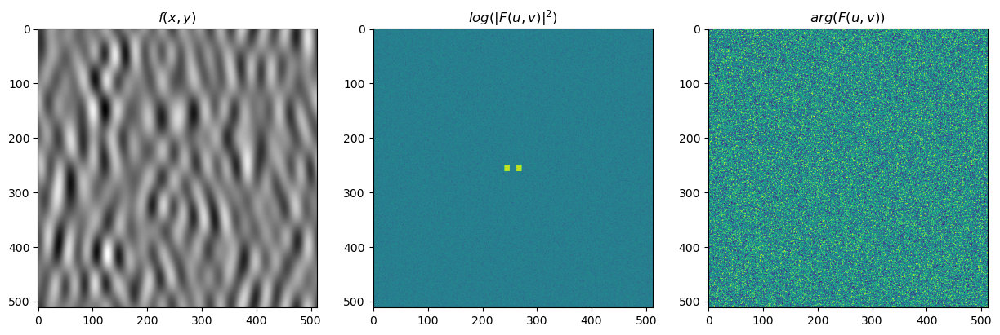

In [37]:
f2 = f.copy()
f2[250:262,262:272] *= 1000
f2[250:262,240:250] *= 1000
amplitude = np.sqrt(np.real(f2)**2+np.imag(f2)**2)
im2 = ifft2(ifftshift(f2)).real

show_fourier(im2,f2)

Now we could also decide to mask the central region, which would remove the peaks that we just created and put all those values at zero. The image will once again look random:

/tmp/ipykernel_54960/1077195016.py:24: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(ampl(f)), cmap = 'viridis')# show log so as to see more than just the global maximum


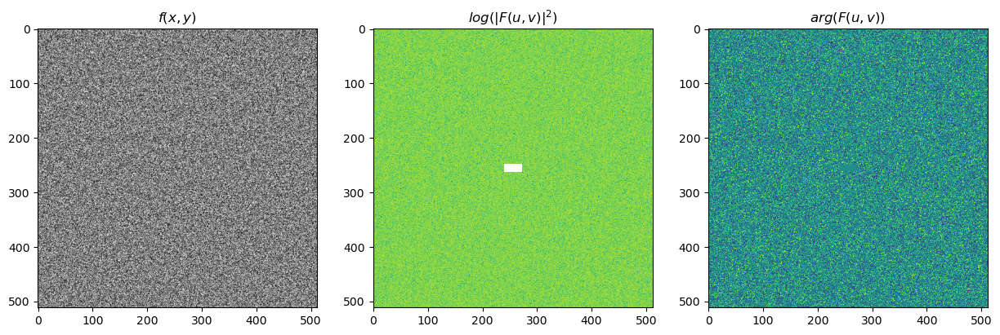

In [38]:
f3 = f2.copy()
f3[250:262,240:272] = 0
amplitude = np.sqrt(np.real(f3)**2+np.imag(f3)**2)
im3 = ifft2(ifftshift(f3)).real

show_fourier(im3,f3)

Starting from those examples and the code below:

1. Use the Fourier transform to reduce the [dithering](https://en.wikipedia.org/wiki/Dither) of the *moire.png* image by building a low-pass filter.
1. Build a high-pass filter using Fourier transform and apply the filter to the "walking" image.

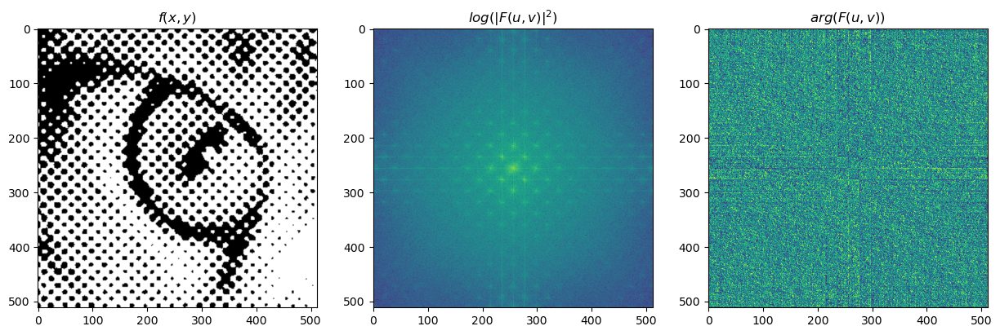

In [39]:
im = imread('moire1.png')
f = fftshift(fft2(im)) # shift Fourier image so that the center corresponds to low frequencies

show_fourier(im,f)


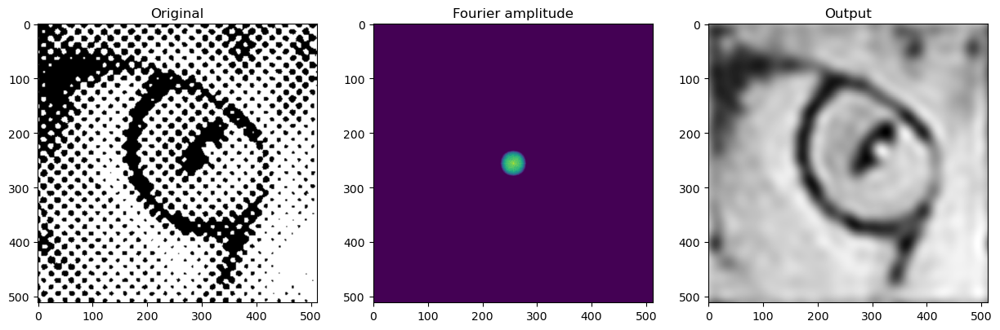

In [40]:
from skimage.morphology import disk
from skimage.filters import gaussian

# 1. Reduce dithering
# Fourier mask
dsize = 15
mask = np.zeros(im.shape)
mask[im.shape[0]//2-dsize:im.shape[0]//2+dsize+1,im.shape[1]//2-dsize:im.shape[1]//2+dsize+1] = disk(dsize)
mask = gaussian(mask,2)

f2 = f*mask

r = inv_fourier2(f2)

plt.figure(figsize=[15,5])
plt.subplot(1,3,1)
plt.imshow(im,cmap = plt.cm.gray)
plt.title('Original')
plt.subplot(1,3,2)
plt.imshow(np.log(ampl(f2)+1), cmap = 'viridis') # show log so as to see more than just the global maximum
plt.title('Fourier amplitude')
plt.subplot(1,3,3)
plt.imshow(r, interpolation='none', cmap = plt.cm.gray)
plt.title('Output')
plt.show()


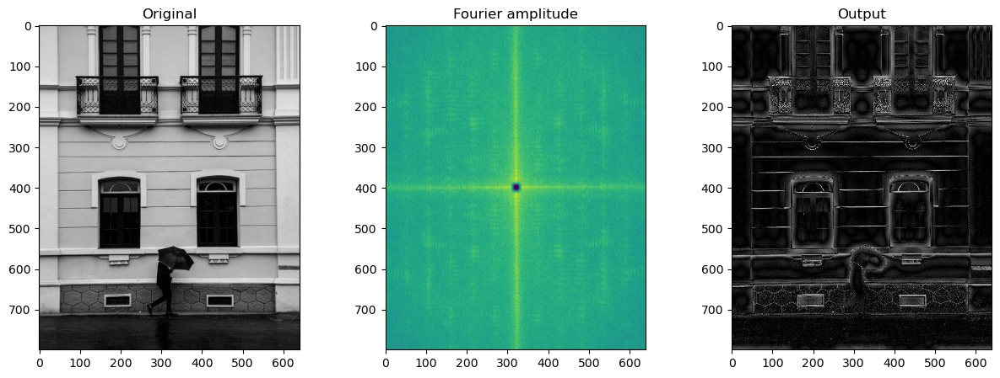

In [41]:
# 2. High pass filter

im = imread('walking.jpg')
f = fftshift(fft2(im))

# Fourier mask
dsize = 15
mask = np.ones(im.shape)
mask[im.shape[0]//2-dsize:im.shape[0]//2+dsize+1,im.shape[1]//2-dsize:im.shape[1]//2+dsize+1] = 1-disk(dsize)
mask = gaussian(mask,2)

f3 = f*mask

r3 = inv_fourier2(f3)

plt.figure(figsize=[15,5])
plt.subplot(1,3,1)
plt.imshow(im,cmap = plt.cm.gray)
plt.title('Original')
plt.subplot(1,3,2)
plt.imshow(np.log(ampl(f3)+1), cmap = 'viridis') # show log so as to see more than just the global maximum
plt.title('Fourier amplitude')
plt.subplot(1,3,3)
plt.imshow(np.abs(r3), interpolation='none', cmap = plt.cm.gray)
plt.title('Output')
plt.show()



**Need more help? You can check the following videos:**

* [Understanding the 2D Fourier transform](https://www.youtube.com/watch?v=bsNQpeBZ7IY&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=18)
* [Filters in Fourier space](https://www.youtube.com/watch?v=8g-sE7wkKpU&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=19)

## 4. Morphological operations

* For morphology functions, [see the skimage documentation](http://scikit-image.org/docs/dev/api/skimage.morphology.html?highlight=morphology#module-skimage.morphology)

Starting from the example below:

1. Using the "opening" operation with a disk structuring element of increasing size, determine how many circles of any given radius there are in the *circles.png* image.
1. Build a morphological filter that eliminates one size of circles.

Number of big circles : 4
Number of medium circles : 6
Number of small circles : 10
Number of little circles : 28


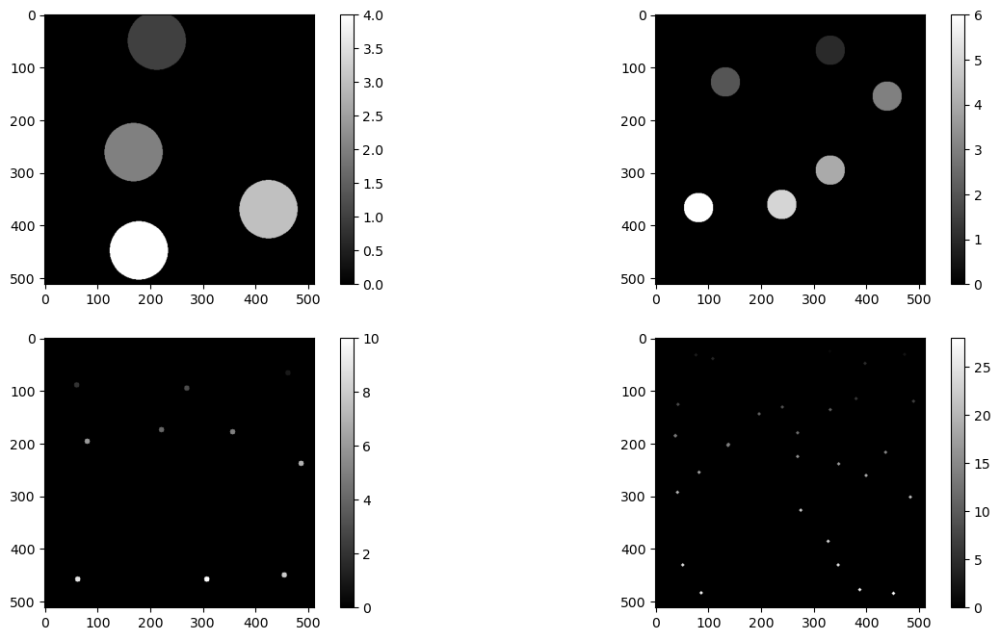

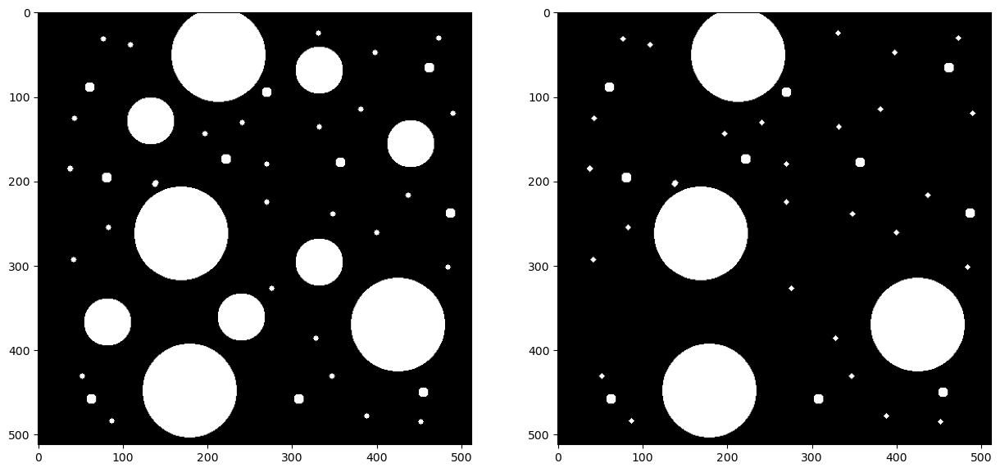

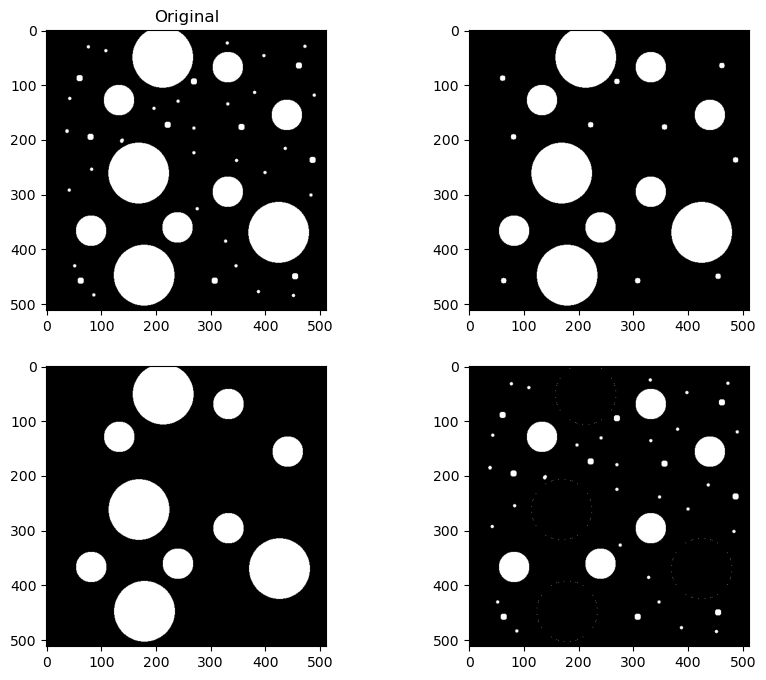

In [42]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
from skimage.io import imread
from skimage.morphology import disk, erosion, dilation, opening, closing
from skimage.measure import label, regionprops

im = imread('circles1.png')==0 #to be sure objects are = 1

# use the local maximum and local minimum for dilation and erosion
mask = disk(5)
eroded_image = erosion(im, mask)
dilated_image = dilation(im, mask)
opened_image = opening(im, mask) # erosion then dilation
closed_image = closing(im, mask) # dilation then erosion

def show():
    plt.figure(figsize=[10,8])
    plt.subplot(2,3,1)
    plt.imshow(im, cmap=plt.cm.gray)
    plt.title('Original')
    plt.subplot(2,3,2)
    plt.imshow(eroded_image, cmap=plt.cm.gray)
    plt.title('Erosion')
    plt.subplot(2,3,3)
    plt.imshow(dilated_image, cmap=plt.cm.gray)
    plt.title('Dilation')

    plt.subplot(2,3,4)
    plt.imshow(im, cmap=plt.cm.gray)
    plt.title('Original')
    plt.subplot(2,3,5)
    plt.imshow(opened_image, cmap=plt.cm.gray)
    plt.title('Opening')
    plt.subplot(2,3,6)
    plt.imshow(closed_image, cmap=plt.cm.gray)
    plt.title('Closing')
    plt.show()

big_circles = opening(opening(im, disk(30)), disk(1))
medium_circles = opening((opening(im, disk(10))==0 + big_circles)==0, disk(1))
small_circles = opening((opening(im, disk(5))==0 + medium_circles + big_circles)==0, disk(1))
little_circles = opening((im==0 + big_circles + medium_circles + small_circles)==0, disk(1))

def number_of_circle():
    big_lab = label(big_circles,background=0)
    medium_lab = label(medium_circles,background=0)
    small_lab = label(small_circles,background=0)
    little_lab = label(little_circles,background=0)

    print("Number of big circles :", len(regionprops(big_lab)))
    print("Number of medium circles :", len(regionprops(medium_lab)))
    print("Number of small circles :", len(regionprops(small_lab)))
    print("Number of little circles :", len(regionprops(little_lab)))

    plt.figure(figsize=[15,8])
    plt.subplot(2,2,1)
    plt.imshow(big_lab)
    plt.colorbar()
    plt.subplot(2,2,2)
    plt.imshow(medium_lab)
    plt.colorbar()
    plt.subplot(2,2,3)
    plt.imshow(small_lab)
    plt.colorbar()
    plt.subplot(2,2,4)
    plt.imshow(little_lab)
    plt.colorbar()
    plt.show()

number_of_circle()

def make_disappear(im, size):
    mask = im
    if size == "little":
        mask = little_circles
    elif size == "small":
        mask = small_circles
    elif size == "medium":
        mask = medium_circles
    elif size == "big":
        mask = big_circles

    return (im==0 + mask)==0

plt.figure(figsize=[15,8])
plt.subplot(1,2,1)
plt.imshow(im)
plt.subplot(1,2,2)
plt.imshow(opening(make_disappear(im, 'medium'), disk(1)))
plt.show()

def show_morphological_filters():
    plt.figure(figsize=[10,8])
    plt.subplot(2,2,1)
    plt.imshow(little_circles)
    plt.subplot(2,2,2)
    plt.imshow(small_circles)
    plt.subplot(2,2,3)
    plt.imshow(medium_circles)
    plt.subplot(2,2,4)
    plt.imshow(big_circles)
    plt.show()

# show_morphological_filters()

def show2():
    plt.figure(figsize=[10,8])
    plt.subplot(2,2,1)
    plt.imshow(im)
    plt.title('Original')
    plt.subplot(2,2,2)
    plt.imshow(opening(im, disk(5)))
    plt.subplot(2,2,3)
    plt.imshow(opening(im, disk(10)))
    plt.subplot(2,2,4)
    plt.imshow((im==0 + opening(im, disk(30)))==0)
    plt.show()

show2()

**Need more help? You can check the following videos:**

* [Morphological operations](https://www.youtube.com/watch?v=b64M2dZaWPA&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=20)

## 5. Edge detection

Using the [convolve2d](http://docs.scipy.org/doc/scipy-0.15.1/reference/generated/scipy.signal.convolve2d.html) function, develop the Sobel filter. 
The Sobel operator is given by
$$\mathbf{G} = \sqrt{ {\mathbf{G}_x}^2 + {\mathbf{G}_y}^2 }$$
where $G_x$ and $G_y$ are images respectively obtained by a convolution with the given kernels
$$\mathbf{g}_y = \begin{bmatrix} 
    -1 & -2 & -1  \\
    0 & 0 & 0 \\
    +1 & +2 & +1 
    \end{bmatrix}
    \quad
    \mbox{and}
    \quad   
    \mathbf{g}_x = \begin{bmatrix} 
    -1 & 0 & +1 \\
    -2 & 0 & +2 \\
    -1 & 0 & +1 
    \end{bmatrix}
    $$

**Apply the Sobel filter** to find the edges in the "road" image.

Compare with the results of the **Canny edge filter** with different "sigma" values (see [the skimage documentation](http://scikit-image.org/docs/dev/auto_examples/edges/plot_canny.html))

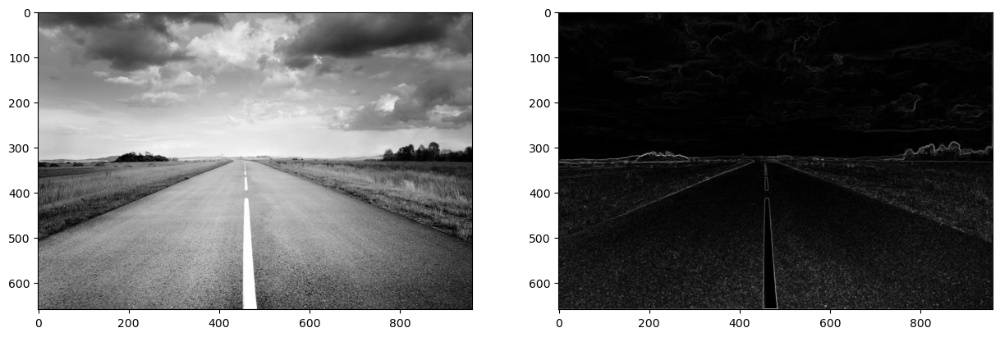

In [43]:
from skimage.data import camera
from skimage.io import imread
from scipy.signal import convolve2d

im = imread('road.jpg', as_gray=True)

def sobel(im):
    gy = np.array([[-1.,-2.,-1.],[0.,0.,0.],[1.,2.,1.]])
    gx = gy.T # transpose operator
    Gy = convolve2d(im,gy,'same')
    Gx = convolve2d(im,gx,'same')
    return np.sqrt(Gy**2+Gx**2) # All of those operations will be done element-wise !

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow(im, cmap=plt.cm.gray)
plt.subplot(1,2,2)
plt.imshow(sobel(im), cmap=plt.cm.gray)
plt.show()


let's clear the noise with a median filter

/home/onyx/anaconda3/lib/python3.11/site-packages/IPython/core/interactiveshell.py:3526: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  exec(code_obj, self.user_global_ns, self.user_ns)


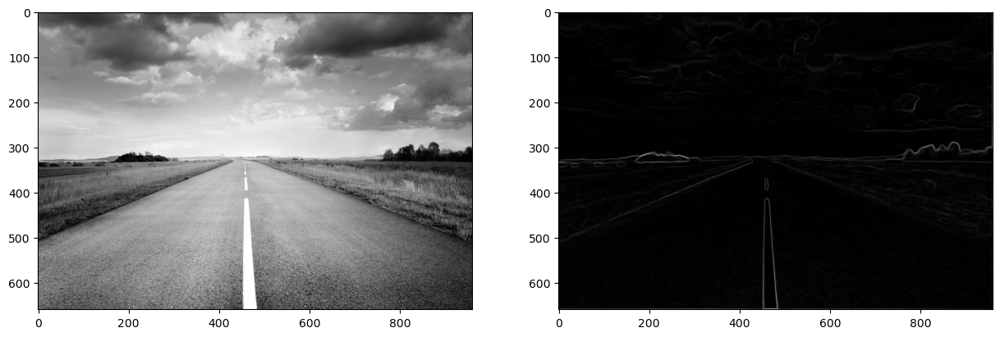

In [44]:
from skimage.filters.rank import median
from skimage.morphology import disk
im = imread('road.jpg', as_gray=True)
im_m = median(im, disk(5))

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow(im, cmap=plt.cm.gray)
plt.subplot(1,2,2)
plt.imshow(sobel(im_m), cmap=plt.cm.gray)
plt.show()

Use the **[Hough transform](http://scikit-image.org/docs/dev/auto_examples/edges/plot_line_hough_transform.html)** to find the main straight lines in the road image, using the results from the Canny edge detector.

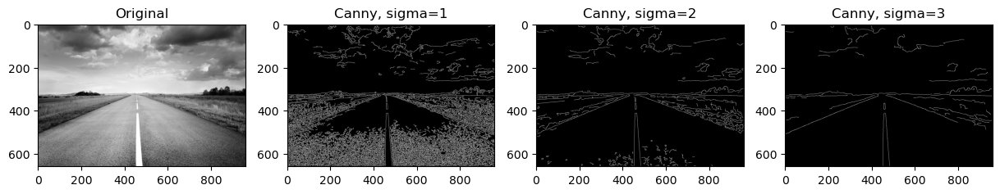

In [45]:
# Canny edge detector
from skimage.feature import canny

border1 = canny(im, sigma=1)
border2 = canny(im, sigma=2)
border3 = canny(im, sigma=3)

plt.figure(figsize=(15,15))
plt.subplot(1,4,1)
plt.imshow(im, cmap=plt.cm.gray)
plt.title('Original')
plt.subplot(1,4,2)
plt.imshow(border1, cmap=plt.cm.gray)
plt.title('Canny, sigma=1')
plt.subplot(1,4,3)
plt.imshow(border2, cmap=plt.cm.gray)
plt.title('Canny, sigma=2')
plt.subplot(1,4,4)
plt.imshow(border3, cmap=plt.cm.gray)
plt.title('Canny, sigma=3')
plt.show()

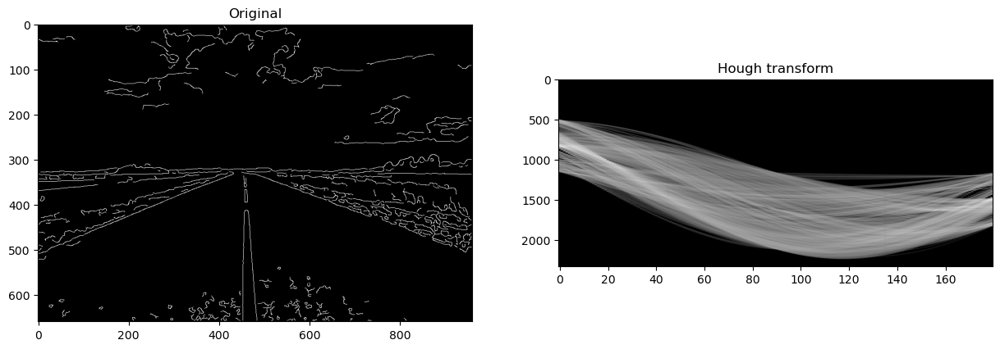

/tmp/ipykernel_54960/1890121690.py:18: RuntimeWarning: divide by zero encountered in scalar divide
  y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
/tmp/ipykernel_54960/1890121690.py:19: RuntimeWarning: divide by zero encountered in scalar divide
  y1 = (dist - im.shape[1] * np.cos(angle)) / np.sin(angle)


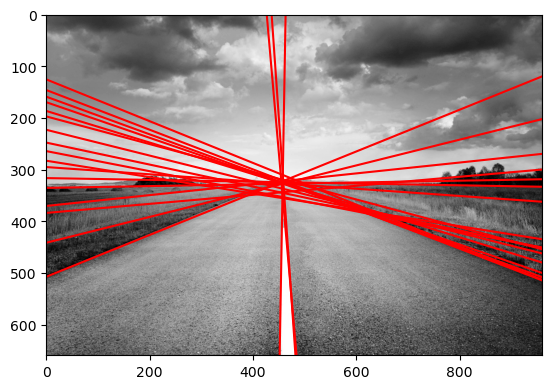

/tmp/ipykernel_54960/1890121690.py:28: RuntimeWarning: divide by zero encountered in scalar divide
  y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
/tmp/ipykernel_54960/1890121690.py:29: RuntimeWarning: divide by zero encountered in scalar divide
  y1 = (dist - im.shape[1] * np.cos(angle)) / np.sin(angle)


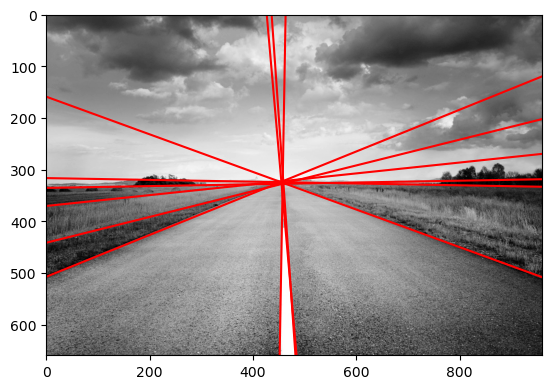

In [46]:
# Hough transform
from skimage.transform import hough_line, hough_line_peaks

h, theta, d = hough_line(border2)

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow(border2, cmap=plt.cm.gray)
plt.title('Original')
plt.subplot(1,2,2)
plt.imshow(np.log(h+1), aspect=1/30, cmap=plt.cm.gray)
plt.title('Hough transform')
plt.show()

plt.figure()
plt.imshow(im, cmap=plt.cm.gray)
for _, angle, dist in zip(*hough_line_peaks(h, theta, d)):
    y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
    y1 = (dist - im.shape[1] * np.cos(angle)) / np.sin(angle)
    plt.plot((0, im.shape[1]), (y0, y1), '-r')
plt.xlim([0, im.shape[1]])
plt.ylim([im.shape[0],0])
plt.show()

plt.figure()
plt.imshow(im, cmap=plt.cm.gray)
for _, angle, dist in zip(*hough_line_peaks(h, theta, d, num_peaks=10)):
    y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
    y1 = (dist - im.shape[1] * np.cos(angle)) / np.sin(angle)
    plt.plot((0, im.shape[1]), (y0, y1), '-r')
plt.xlim([0, im.shape[1]])
plt.ylim([im.shape[0],0])
plt.show()


**Need more help? You can check the following videos:**

* [Edge detection with the Sobel filter](https://www.youtube.com/watch?v=QCjh8yyW-Wo&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=21)
* [Edge detection with the Canny transform](https://www.youtube.com/watch?v=yS5NnpWmuuI&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=22)
* [Line detection with the Hough Transform](https://www.youtube.com/watch?v=GD2xipfKQyY&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=23)

# Coding project - Picture enhancement

Write code that automatically enhances a photograph.

<img src="etretat.jpg" width="250px" />
<img src="ex_enhance.jpg" width="250px" />

"Enhance" may mean a lot of different things, and we encourage you to be creative in which enhancements you want to implement.

Some possibilities include (not an exhaustive list):

* Noise reduction
* Auto-level
* Gamma correction (with gamma provided by the user or automatically determined from the image histogram)
* Increase colour saturation
* ...

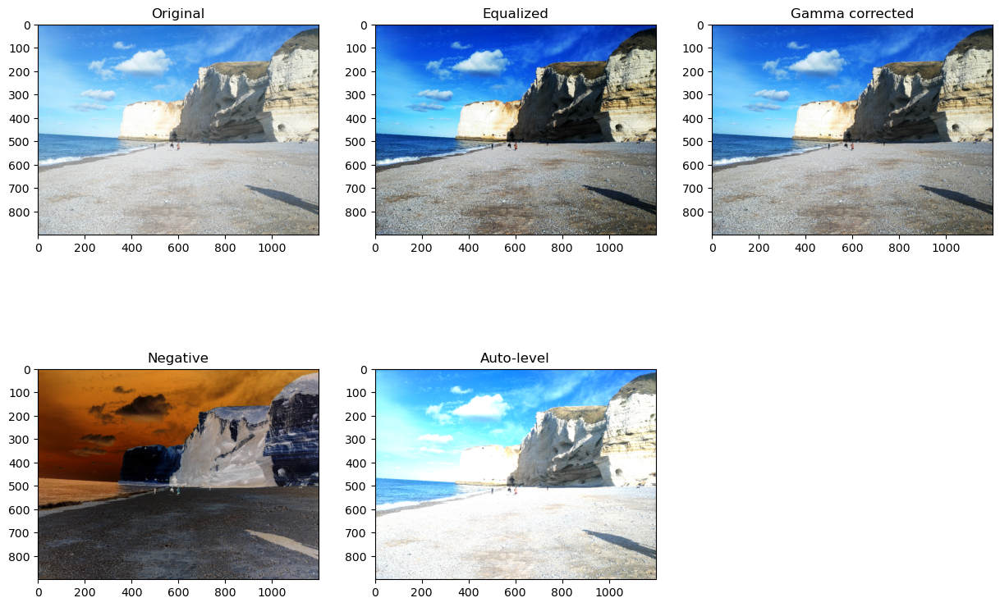

In [72]:
from skimage.color import rgb2hsv, hsv2rgb
from skimage.io import imread,imshow,imsave

im = imread('etretat.jpg')

# Equalization
def equalize(im):
    hist = cumul_hist(im)
    lut = (hist*255).astype(np.uint8)
    return lut[im]

# Gamma transformation
def gamma_corr(im, gamma):
    gamma = 1.8
    lut_gamma = (np.power(np.arange(0,256),gamma) * np.power(255,1-gamma)).astype('uint8')
    return lut_gamma[im]

# Negative
def negative(im):
    lut = np.arange(255,-1,-1)
    return lut[im]

# Auto-level
def auto_level(im):
    th_min, th_max = 20,200
    low_val, high_val = 0, 255

    lut_stretch = np.arange(256)
    lut_stretch[:th_min], lut_stretch[th_max:] = low_val, high_val
    lut_stretch[th_min:th_max] = (high_val-low_val)/(th_max-th_min) * (lut_stretch[th_min:th_max] - th_min) + low_val

    return lut_stretch[im]


plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
plt.imshow(im)
plt.title('Original')
plt.subplot(2,3,2)
plt.imshow(equalize(im))
plt.title('Equalized')
plt.subplot(2,3,3)
plt.imshow(gamma_corr(im, 1.8))
plt.title('Gamma corrected')
plt.subplot(2,3,4)
plt.imshow(negative(im))
plt.title('Negative')
plt.subplot(2,3,5)
plt.imshow(auto_level(im))
plt.title('Auto-level')
plt.show()


